In [44]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns

In [35]:
cities =pd.read_csv('results\cities_segments_df.csv')
cities.drop('Unnamed: 0',inplace =True, axis=1)
cities.head()

,highway,cycleway,surface,maxspeed,length,lanes,oneway,width,centrality,geometry,index,city
0,0.838509,0.858307,0.448370,0.757764,121.661,0.448370,0.295031,0.358696,0.178571,"LINESTRING (8.101751999999999 47.4053158, 8.10...",41.836180,Aarau
1,0.838509,0.988354,0.516304,0.757764,315.596,0.516304,0.295031,0.413043,0.357143,"LINESTRING (8.101751999999999 47.4053158, 8.10...",46.824534,Aarau
2,0.838509,1.872671,0.701087,1.326087,59.281,0.701087,0.295031,0.560870,0.446429,"LINESTRING (8.0873448 47.4045007, 8.0865589 47...",67.417702,Aarau
3,0.838509,1.872671,0.701087,1.326087,21.617,0.701087,0.295031,0.560870,0.446429,"LINESTRING (8.0873448 47.4045007, 8.0876315000...",67.417702,Aarau
4,1.006211,1.365489,0.713315,1.704969,93.415,0.713315,0.295031,0.570652,0.446429,"LINESTRING (8.0873448 47.4045007, 8.0873585000...",68.154115,Aarau


Print MIn and MAx of index before scaling

In [36]:
print(cities['index'].min())
print(cities['index'].max())

25.61335401
99.9999999


In [37]:
#scale segments index
def rescale(values, new_min = 0, new_max = 100):
    output = []
    old_min, old_max = min(values), max(values)

    for v in values:
        new_v = (new_max - new_min) / (old_max - old_min) * (v - old_min) + new_min
        output.append(new_v)

    return output
cities['index_scaled'] =rescale(cities['index'])

Calculate new average index for cities using scaled ssegment index

In [38]:
dflist = []
for i in range(len(cities['city'].unique())):
    df = cities[cities['city']==cities['city'].unique()[i]]
    df['scaled_city_index'] =np.average(df['index_scaled'],weights=df['length'])
    dflist.append(df)
cities_segments_scaled =pd.concat(dflist)

In [39]:
new_result_cities = cities_segments_scaled.groupby(['city']).mean()
new_result_cities.reset_index(level=0, inplace=True)

In [75]:
len(new_result_cities)

31

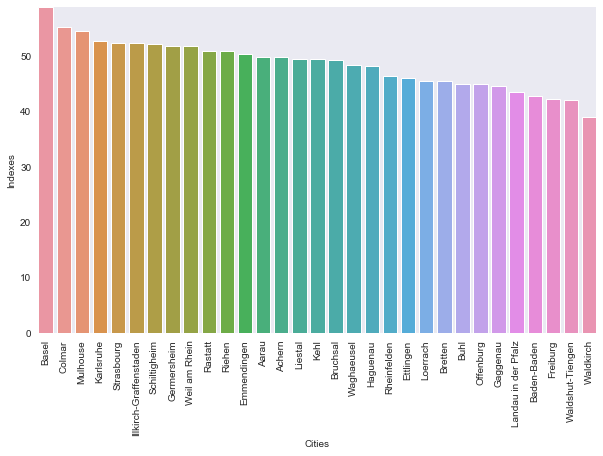

In [40]:
#plot scaled results
plt.figure(figsize=(10,6))
# make barplot and sort bars
chart =sns.barplot(x='city', y="scaled_city_index", data=new_result_cities, 
            order=new_result_cities.sort_values('scaled_city_index', ascending= False).city)
sns.despine(left=True, bottom=True)
sns.set_style("dark")
chart.set_xticklabels(chart.get_xticklabels(), rotation=90)
#plt.title('Bikeability Indexes Whole city')
chart.set(xlabel="Cities", ylabel = "Indexes")
plt.margins(0,0)
plt.show()

In [41]:
#Now a plot for original indexes
cities_results =pd.read_csv('results\\result_cities.csv')
cities_results[['city','country']] =cities_results['place'].str.split(',',expand=True)
cities_results.head()

,place,average_index,max_index,min_index,std_index,city,country
0,"Baden-Baden,Germany",57.436195,86.164596,31.366460,11.099489,Baden-Baden,Germany
1,"Karlsruhe,Germany",64.795059,93.892339,33.618012,10.276534,Karlsruhe,Germany
2,"Bretten,Germany",59.510385,91.760481,29.105202,9.959107,Bretten,Germany
3,"Bruchsal,Germany",62.246594,88.464458,32.707902,8.989619,Bruchsal,Germany
4,"Ettlingen,Germany",59.926029,87.808583,33.959910,8.964276,Ettlingen,Germany


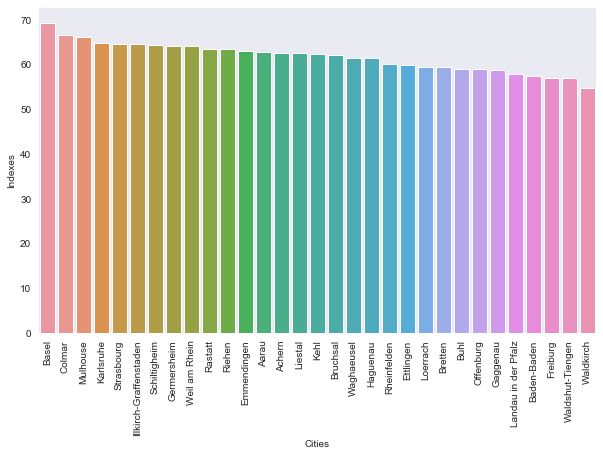

In [95]:
 plt.figure(figsize=(10,6))
 plot =sns.barplot(x='city', y="average_index", data=cities_results, order=cities_results.sort_values('average_index', ascending= False).city)
 sns.set_style("dark")
 plot.set(xlabel="Cities", ylabel = "Indexes")
 plot.set_xticklabels(plot.get_xticklabels(), rotation=90)
 plt.show()
 #plt.savefig('cities_uberhine.png',bbox_inches='tight')

In [84]:
grid_results =pd.read_csv('results\\result_grid.csv')
grid_results[['city','country']] =grid_results['place'].str.split(',',expand=True)
grid_results

,place,average_index,max_index,min_index,std_index,grids,nsegments,unused_grids,city,country
0,"Baden-Baden,Germany",62.391785,88.765528,31.739130,11.733819,23.0,10350.0,17.0,Baden-Baden,Germany
1,"Karlsruhe,Germany",66.142236,94.506987,31.017081,10.630309,23.0,52146.0,15.0,Karlsruhe,Germany
2,"Bretten,Germany",62.022655,91.760481,34.336180,10.426085,11.0,6698.0,8.0,Bretten,Germany
3,"Bruchsal,Germany",61.207103,89.635093,30.174135,10.036691,16.0,9220.0,12.0,Bruchsal,Germany
4,"Ettlingen,Germany",64.967633,89.144927,34.559696,9.789124,9.0,7005.0,6.0,Ettlingen,Germany
5,"Waghaeusel,Germany",62.661482,87.793306,38.123994,8.856305,6.0,3702.0,4.0,Waghaeusel,Germany
6,"Buhl,Germany",60.579950,85.440606,34.730849,9.789101,15.0,5586.0,13.0,Buhl,Germany
7,"Gaggenau,Germany",62.520784,86.496229,34.730849,10.801968,9.0,2709.0,8.0,Gaggenau,Germany
8,"Rastatt,Germany",65.750297,87.246377,38.548137,11.229479,11.0,11397.0,8.0,Rastatt,Germany
9,"Freiburg,Germany",61.446697,93.711180,31.521739,11.908607,23.0,43411.0,12.0,Freiburg,Germany


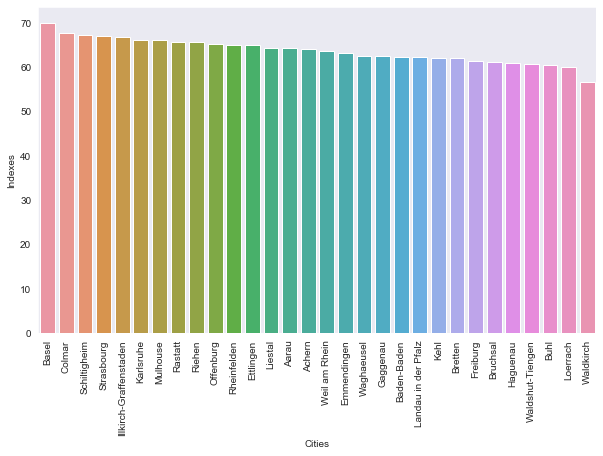

In [89]:
 plt.figure(figsize=(10,6))
 ax =sns.barplot(x='city', y="average_index", data=grid_results, order=grid_results.sort_values('average_index', ascending= False).city)
 sns.set_style("dark")
 ax.set(xlabel="Cities", ylabel = "Indexes")
 ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
 plt.show()
 #plt.savefig('grid_uberhine.png',bbox_inches='tight')

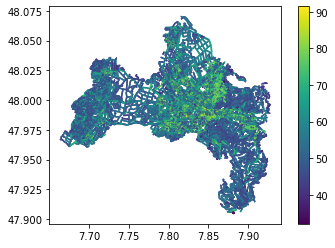

In [3]:
a.plot(column ='index', legend = True)